In [2]:
# The code was removed by Watson Studio for sharing.

In [20]:
!pip install pandas-profiling

     |████████████████████████████████| 133kB 12.9MB/s eta 0:00:01
     |████████████████████████████████| 614kB 17.9MB/s eta 0:00:01
  Stored in directory: /home/dsxuser/.cache/pip/wheels/ce/c7/f1/dbfef4848ebb048cb1d4a22d1ed0c62d8ff2523747235e19fe
  Stored in directory: /home/dsxuser/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
  Stored in directory: /home/dsxuser/.cache/pip/wheels/b0/b2/96/2074eee7dbf7b7df69d004c9b6ac4e32dad04fb7666cf943bd
Successfully built pandas-profiling htmlmin confuse


### Obtain data and explore
#Read CSV input file into a Dataframe
#Download data only for relevant columns so that the data volume is manageable

In [3]:
body = client_273faebd9bbe4696bb7782fea6804875.get_object(Bucket='capstoneex1ram-donotdelete-pr-c3pfkhjz0s3lno',Key='fhrw-4uyv.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )
    
df_data_1 = pd.read_csv(body)
df_data_1.head()

,created_date,unique_key,complaint_type,incident_zip,incident_address,street_name,address_type,city,resolution_description,borough,latitude,longitude,closed_date,location_type,status
0,2019-09-23T23:44:07.000,43874954,GENERAL,10452.0,1055 JEROME AVENUE,JEROME AVENUE,ADDRESS,BRONX,The following complaint conditions are still o...,BRONX,40.832955,-73.925212,NaN,RESIDENTIAL BUILDING,Open
1,2019-09-23T22:45:58.000,43874034,APPLIANCE,11225.0,441 BROOKLYN AVENUE,BROOKLYN AVENUE,ADDRESS,BROOKLYN,The following complaint conditions are still o...,BROOKLYN,40.664148,-73.945460,NaN,RESIDENTIAL BUILDING,Open
2,2019-09-23T05:27:25.000,43870498,WATER LEAK,11102.0,24-35 CRESCENT STREET,CRESCENT STREET,ADDRESS,Astoria,The following complaint conditions are still o...,QUEENS,40.774266,-73.919941,NaN,RESIDENTIAL BUILDING,Open
3,2019-09-23T07:47:31.000,43869804,PLUMBING,11216.0,778 LINCOLN PLACE,LINCOLN PLACE,ADDRESS,BROOKLYN,The following complaint conditions are still o...,BROOKLYN,40.670773,-73.951024,NaN,RESIDENTIAL BUILDING,Open
4,2019-09-23T22:02:53.000,43871130,GENERAL,11228.0,1405 70 STREET,70 STREET,ADDRESS,BROOKLYN,The following complaint conditions are still o...,BROOKLYN,40.621583,-74.001877,NaN,RESIDENTIAL BUILDING,Open


In [4]:
# Load the PLUTO dataset for the Bronx borough
# Ensure that you use only a limited number of fields from the dataset so that you are not consuming too much memory during your analysis.
# Take a peek

col = ['Address', 'BldgArea', 'BldgDepth', 'BuiltFAR', 'CommFAR', 'FacilFAR', 'Lot', 'LotArea', 'LotDepth', 
                 'NumBldgs', 'NumFloors', 'OfficeArea', 'ResArea', 'ResidFAR', 'RetailArea', 'YearBuilt', 'YearAlter1',
                  'ZipCode', 'YCoord', 'XCoord'] 

body = client_273faebd9bbe4696bb7782fea6804875.get_object(Bucket='capstoneex1ram-donotdelete-pr-c3pfkhjz0s3lno',Key='BX_18v1.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_bx = pd.read_csv(body, usecols = col)
df_data_bx.head()

,Lot,ZipCode,Address,LotArea,BldgArea,ResArea,OfficeArea,RetailArea,NumBldgs,NumFloors,LotDepth,BldgDepth,YearBuilt,YearAlter1,BuiltFAR,ResidFAR,CommFAR,FacilFAR,XCoord,YCoord
0,1,10454.0,122 BRUCKNER BOULEVARD,15000,0,0,0,0,1,0.0,200.0,0.0,0,0,0.00,6.02,5.0,6.5,1005957.0,232162.0
1,4,10454.0,126 BRUCKNER BOULEVARD,13770,752,0,272,0,2,1.0,100.0,16.0,1931,1994,0.05,6.02,5.0,6.5,1006076.0,232156.0
2,10,10454.0,138 BRUCKNER BOULEVARD,35000,39375,0,0,0,1,2.0,200.0,200.0,1931,0,1.13,6.02,5.0,6.5,1006187.0,232036.0
3,17,10454.0,144 BRUCKNER BOULEVARD,2500,12500,12500,0,0,1,5.0,100.0,85.0,1931,2001,5.00,6.02,5.0,6.5,1006299.0,232033.0
4,18,10454.0,148 BRUCKNER BOULEVARD,1875,8595,6876,0,1719,1,5.0,75.0,70.0,1920,2009,4.58,6.02,5.0,6.5,1006363.0,232040.0


### Data Exploration
Explore and Prepare the Complaint file

In [5]:
# Verify our column selection
df_data_1.columns

Index(['created_date', 'unique_key', 'complaint_type', 'incident_zip',
       'incident_address', 'street_name', 'address_type', 'city',
       'resolution_description', 'borough', 'latitude', 'longitude',
       'closed_date', 'location_type', 'status'],
      dtype='object')

### New York City Open Data data file web site indicated that the complaint type "HEAT/HOT Water" was renamed from "HEATING" after 2014. So we should combine these two types into one.

In [6]:
# Check the dataframe's "before" complaint counts
df_data_1['complaint_type'].value_counts()

HEAT/HOT WATER            1152173
HEATING                    887869
PLUMBING                   703354
GENERAL CONSTRUCTION       500863
UNSANITARY CONDITION       438182
PAINT - PLASTER            361258
PAINT/PLASTER              341577
ELECTRIC                   303834
NONCONST                   260890
DOOR/WINDOW                200360
WATER LEAK                 188142
GENERAL                    146746
FLOORING/STAIRS            135528
APPLIANCE                  110021
HPD Literature Request      52830
SAFETY                      50182
OUTSIDE BUILDING             7038
ELEVATOR                     6466
Unsanitary Condition         5499
CONSTRUCTION                 5078
General                      1163
Safety                        424
STRUCTURAL                     16
Plumbing                       11
AGENCY                          9
VACANT APARTMENT                8
Outside Building                6
Appliance                       4
Mold                            1
Name: complain

In [7]:
# Combine the Heating complaints with Heat/Hot Water
df_data_1['complaint_type'] = np.where(df_data_1['complaint_type']=='HEATING','HEAT/HOT WATER',df_data_1['complaint_type'])

### Then, let's see the top complaints once again after combining the Heating category

In [8]:
# Check the dataframe's "after" complaint counts
df_data_1['complaint_type'].value_counts()

HEAT/HOT WATER            2040042
PLUMBING                   703354
GENERAL CONSTRUCTION       500863
UNSANITARY CONDITION       438182
PAINT - PLASTER            361258
PAINT/PLASTER              341577
ELECTRIC                   303834
NONCONST                   260890
DOOR/WINDOW                200360
WATER LEAK                 188142
GENERAL                    146746
FLOORING/STAIRS            135528
APPLIANCE                  110021
HPD Literature Request      52830
SAFETY                      50182
OUTSIDE BUILDING             7038
ELEVATOR                     6466
Unsanitary Condition         5499
CONSTRUCTION                 5078
General                      1163
Safety                        424
STRUCTURAL                     16
Plumbing                       11
AGENCY                          9
VACANT APARTMENT                8
Outside Building                6
Appliance                       4
Mold                            1
Name: complaint_type, dtype: int64

### Filter the Data Set by the answer from Question 1.

We will use the answer of Heat/Hot Water


In [9]:
# Filter out Heat/Hot Water complaints and verify the result
df_data_1h = df_data_1[df_data_1.complaint_type=='HEAT/HOT WATER'].reset_index(drop = True)
df_data_1h['complaint_type'].value_counts()

HEAT/HOT WATER    2040042
Name: complaint_type, dtype: int64

In [10]:
# Check a few rows
df_data_1h.head()

,created_date,unique_key,complaint_type,incident_zip,incident_address,street_name,address_type,city,resolution_description,borough,latitude,longitude,closed_date,location_type,status
0,2019-09-23T22:37:17.000,43873132,HEAT/HOT WATER,10457.0,1711 MORRIS AVENUE,MORRIS AVENUE,ADDRESS,BRONX,The following complaint conditions are still o...,BRONX,40.844521,-73.909411,NaN,RESIDENTIAL BUILDING,Open
1,2019-09-23T22:33:12.000,43870442,HEAT/HOT WATER,11213.0,1465 PROSPECT PLACE,PROSPECT PLACE,ADDRESS,BROOKLYN,The following complaint conditions are still o...,BROOKLYN,40.673091,-73.927514,NaN,RESIDENTIAL BUILDING,Open
2,2019-09-23T06:21:40.000,43874704,HEAT/HOT WATER,10458.0,200 EAST 205 STREET,EAST 205 STREET,ADDRESS,BRONX,The Department of Housing Preservation and Dev...,BRONX,40.874962,-73.884272,2019-09-23T21:29:00.000,RESIDENTIAL BUILDING,Closed
3,2019-09-23T06:36:46.000,43871051,HEAT/HOT WATER,10031.0,550 WEST 146 STREET,WEST 146 STREET,ADDRESS,NEW YORK,The following complaint conditions are still o...,MANHATTAN,40.826485,-73.948510,NaN,RESIDENTIAL BUILDING,Open
4,2019-09-23T09:07:25.000,43873578,HEAT/HOT WATER,11213.0,1054 PARK PLACE,PARK PLACE,ADDRESS,BROOKLYN,The Department of Housing Preservation and Dev...,BROOKLYN,40.673012,-73.942803,2019-09-23T19:55:24.000,RESIDENTIAL BUILDING,Closed


### Filter the Data Set by borough = Bronx

In [10]:
# Filter out Bronx complaints and verify the result
df_data_hbx = df_data_1h[df_data_1h.borough == 'BRONX'].reset_index(drop = True)
df_data_hbx['borough'].value_counts()

BRONX    569846
Name: borough, dtype: int64

In [11]:
# Check a few rows
df_data_hbx.head()

,created_date,unique_key,complaint_type,incident_zip,incident_address,street_name,address_type,city,resolution_description,borough,latitude,longitude,closed_date,location_type,status
0,2019-09-23T22:37:17.000,43873132,HEAT/HOT WATER,10457.0,1711 MORRIS AVENUE,MORRIS AVENUE,ADDRESS,BRONX,The following complaint conditions are still o...,BRONX,40.844521,-73.909411,NaN,RESIDENTIAL BUILDING,Open
1,2019-09-23T06:21:40.000,43874704,HEAT/HOT WATER,10458.0,200 EAST 205 STREET,EAST 205 STREET,ADDRESS,BRONX,The Department of Housing Preservation and Dev...,BRONX,40.874962,-73.884272,2019-09-23T21:29:00.000,RESIDENTIAL BUILDING,Closed
2,2019-09-23T23:26:00.000,43874045,HEAT/HOT WATER,10455.0,758 KELLY STREET,KELLY STREET,ADDRESS,BRONX,The following complaint conditions are still o...,BRONX,40.817427,-73.898772,NaN,RESIDENTIAL BUILDING,Open
3,2019-09-23T21:23:08.000,43872476,HEAT/HOT WATER,10463.0,3150 BAILEY AVENUE,BAILEY AVENUE,ADDRESS,BRONX,The following complaint conditions are still o...,BRONX,40.878790,-73.901771,NaN,RESIDENTIAL BUILDING,Open
4,2019-09-23T21:23:05.000,43873055,HEAT/HOT WATER,10468.0,2786 JEROME AVENUE,JEROME AVENUE,ADDRESS,BRONX,The complaint you filed is a duplicate of a co...,BRONX,40.869889,-73.895196,NaN,RESIDENTIAL BUILDING,Open


In [12]:
# Check columns
df_data_hbx.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569846 entries, 0 to 569845
Data columns (total 15 columns):
created_date              569846 non-null object
unique_key                569846 non-null int64
complaint_type            569846 non-null object
incident_zip              563889 non-null float64
incident_address          569845 non-null object
street_name               569845 non-null object
address_type              564043 non-null object
city                      563889 non-null object
resolution_description    569820 non-null object
borough                   569846 non-null object
latitude                  563889 non-null float64
longitude                 563889 non-null float64
closed_date               568102 non-null object
location_type             569846 non-null object
status                    569846 non-null object
dtypes: float64(3), int64(1), object(11)
memory usage: 65.2+ MB


In [13]:
# Keep rows with non-null 'incident_address' and check columns
df_data_hbx = df_data_hbx[df_data_hbx.incident_address.notnull()]
df_data_hbx.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 569845 entries, 0 to 569845
Data columns (total 15 columns):
created_date              569845 non-null object
unique_key                569845 non-null int64
complaint_type            569845 non-null object
incident_zip              563889 non-null float64
incident_address          569845 non-null object
street_name               569845 non-null object
address_type              564043 non-null object
city                      563889 non-null object
resolution_description    569819 non-null object
borough                   569845 non-null object
latitude                  563889 non-null float64
longitude                 563889 non-null float64
closed_date               568101 non-null object
location_type             569845 non-null object
status                    569845 non-null object
dtypes: float64(3), int64(1), object(11)
memory usage: 69.6+ MB


### Explore and Prepare the Bronx PLUTO file

In [14]:
# Verify our column selection
df_data_bx.columns

Index(['Lot', 'ZipCode', 'Address', 'LotArea', 'BldgArea', 'ResArea',
       'OfficeArea', 'RetailArea', 'NumBldgs', 'NumFloors', 'LotDepth',
       'BldgDepth', 'YearBuilt', 'YearAlter1', 'BuiltFAR', 'ResidFAR',
       'CommFAR', 'FacilFAR', 'XCoord', 'YCoord'],
      dtype='object')

In [15]:
# Keep rows with non-null 'Address'...i.e. discard rows where address is null
df_data_bx = df_data_bx[df_data_bx.Address.notnull()]
df_data_bx.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 89785 entries, 0 to 89847
Data columns (total 20 columns):
Lot           89785 non-null int64
ZipCode       89522 non-null float64
Address       89785 non-null object
LotArea       89785 non-null int64
BldgArea      89785 non-null int64
ResArea       89785 non-null int64
OfficeArea    89785 non-null int64
RetailArea    89785 non-null int64
NumBldgs      89785 non-null int64
NumFloors     89785 non-null float64
LotDepth      89785 non-null float64
BldgDepth     89785 non-null float64
YearBuilt     89785 non-null int64
YearAlter1    89785 non-null int64
BuiltFAR      89785 non-null float64
ResidFAR      89785 non-null float64
CommFAR       89785 non-null float64
FacilFAR      89785 non-null float64
XCoord        86595 non-null float64
YCoord        86595 non-null float64
dtypes: float64(10), int64(9), object(1)
memory usage: 14.4+ MB


### Final cleanup for both the Complaint and the Bronx PLUTO file

In [16]:
# Find replace in Complaint and Bronx datasets where address column contains two spaces into a single space for each row of the address column
df_data_hbx['incident_address'].replace('  ', ' ', regex=True, inplace=True)
df_data_bx['Address'].replace('  ', ' ', regex=True, inplace=True)
# Get both address columns as the same name
df_data_hbx.rename(columns = {'incident_address': 'Address'}, inplace = True)

In [17]:
# Create a new df of unique addresses from df311 and add a column with a count of how many occurrances of that address
# This resulting df should identify how many complaints by Address have been made in Bronx of HEAT/HOT WATER
df_data_hbxu = df_data_hbx.groupby(['Address','latitude','longitude']) \
    .size() \
    .reset_index(name='count') \
    .sort_values('count', ascending=False)

df_data_hbxu.info()
df_data_hbxu.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22145 entries, 15401 to 22144
Data columns (total 4 columns):
Address      22145 non-null object
latitude     22145 non-null float64
longitude    22145 non-null float64
count        22145 non-null int64
dtypes: float64(2), int64(1), object(1)
memory usage: 865.0+ KB


,Address,latitude,longitude,count
15401,3810 BAILEY AVENUE,40.884336,-73.897524,7088
325,1025 BOYNTON AVENUE,40.824595,-73.877299,5749
12726,2968 PERRY AVENUE,40.870122,-73.884005,2752
21105,888 GRAND CONCOURSE,40.826522,-73.922816,2574
8220,2074 WALLACE AVENUE,40.852670,-73.864860,2451


### Merge Complaint 311 and Pluto bronx datasets

In [18]:
# In case we need to type cast
# q3df.Address = q3df.Address.astype(str)
# bxdf.Address = bxdf.Address.astype(str)

df_merged = df_data_hbxu.merge(df_data_bx, on = 'Address', how = 'inner')
df_merged.info()
df_merged.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19277 entries, 0 to 19276
Data columns (total 23 columns):
Address       19277 non-null object
latitude      19277 non-null float64
longitude     19277 non-null float64
count         19277 non-null int64
Lot           19277 non-null int64
ZipCode       19277 non-null float64
LotArea       19277 non-null int64
BldgArea      19277 non-null int64
ResArea       19277 non-null int64
OfficeArea    19277 non-null int64
RetailArea    19277 non-null int64
NumBldgs      19277 non-null int64
NumFloors     19277 non-null float64
LotDepth      19277 non-null float64
BldgDepth     19277 non-null float64
YearBuilt     19277 non-null int64
YearAlter1    19277 non-null int64
BuiltFAR      19277 non-null float64
ResidFAR      19277 non-null float64
CommFAR       19277 non-null float64
FacilFAR      19277 non-null float64
XCoord        19246 non-null float64
YCoord        19246 non-null float64
dtypes: float64(12), int64(10), object(1)
memory usage: 3.5+ 

,Address,latitude,longitude,count,Lot,ZipCode,LotArea,BldgArea,ResArea,OfficeArea,...,LotDepth,BldgDepth,YearBuilt,YearAlter1,BuiltFAR,ResidFAR,CommFAR,FacilFAR,XCoord,YCoord
0,3810 BAILEY AVENUE,40.884336,-73.897524,7088,7,10463.0,21320,54001,54000,0,...,164.00,92.0,1925,0,2.53,3.44,0.0,4.8,1012722.0,261446.0
1,1025 BOYNTON AVENUE,40.824595,-73.877299,5749,54,10472.0,12319,61500,61500,0,...,100.00,87.0,1931,0,4.99,2.43,0.0,4.8,1018133.0,239710.0
2,1025 BOYNTON AVENUE,40.824660,-73.877313,11,54,10472.0,12319,61500,61500,0,...,100.00,87.0,1931,0,4.99,2.43,0.0,4.8,1018133.0,239710.0
3,2968 PERRY AVENUE,40.870122,-73.884005,2752,19,10458.0,7150,34320,34320,0,...,110.00,88.0,1931,0,4.80,3.00,0.0,3.0,1016326.0,256197.0
4,888 GRAND CONCOURSE,40.826522,-73.922816,2574,34,10451.0,28444,122800,111800,8000,...,188.55,178.0,1931,0,4.32,6.02,0.0,6.5,1005800.0,240335.0


### Draw conclusions
Execute profiling and generate heatmaps

In [31]:
# Pearson
import pandas_profiling as pp

parray = df_merged.corr(method = 'pearson')
parray = parray.round(2)
pp.ProfileReport(parray)

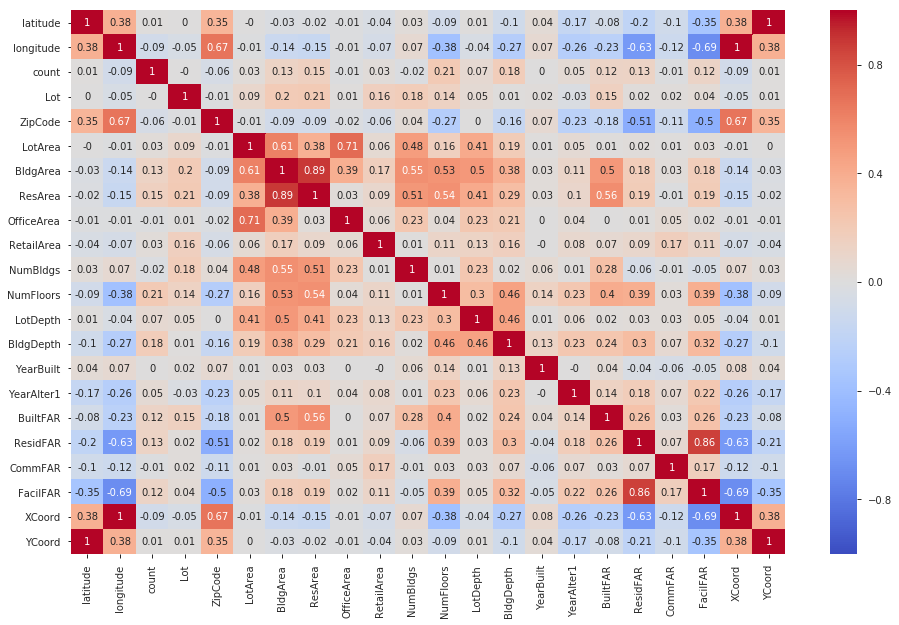

In [22]:
# Pearson
import seaborn as sns
plt.figure(figsize=(16, 10))
sns.heatmap(parray, xticklabels=parray.columns, yticklabels=parray.columns, vmin = -1, vmax = 1, annot = True, cmap = 'coolwarm')

In [32]:
# Kendall
karray = df_merged.corr(method = 'kendall')
karray = karray.round(2)
karray
pp.ProfileReport(karray)

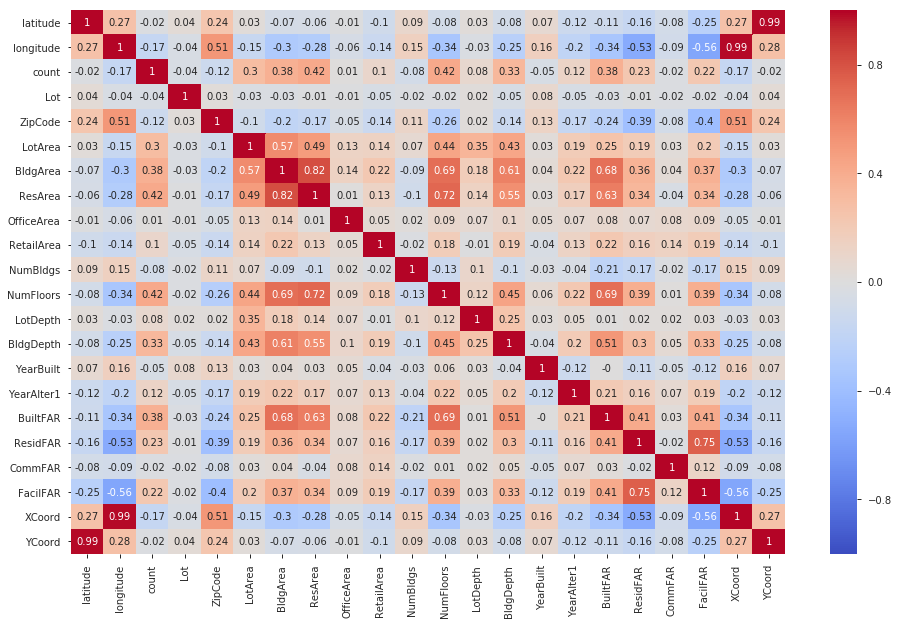

In [24]:
# Kendall
plt.figure(figsize=(16, 10))
sns.heatmap(karray, xticklabels=karray.columns, yticklabels=karray.columns, vmin = -1, vmax = 1, annot = True, cmap = 'coolwarm')

In [33]:
# Spearman
sarray = df_merged.corr(method = 'spearman')
sarray = sarray.round(2)
sarray
pp.ProfileReport(sarray)

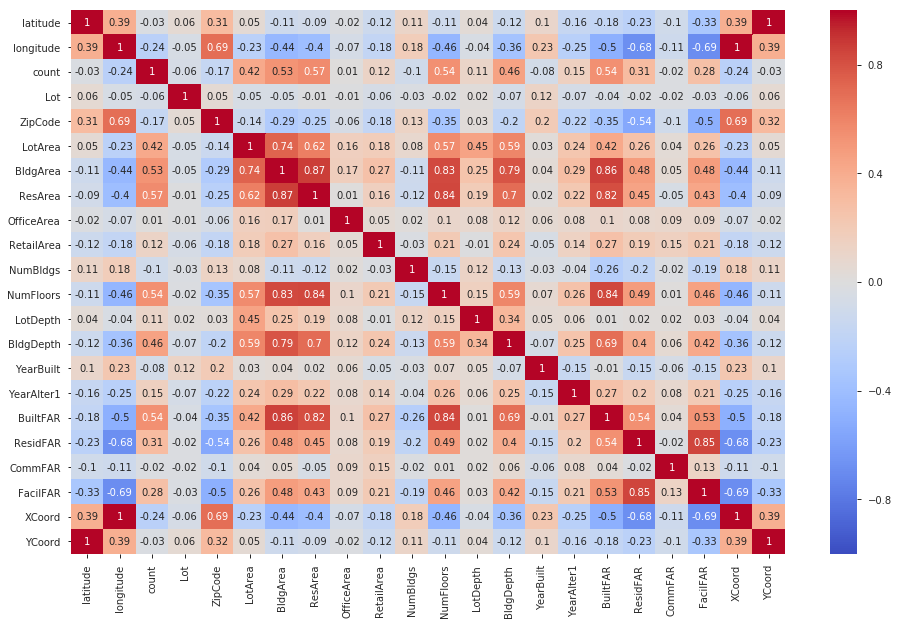

In [25]:
# Spearman
plt.figure(figsize=(16, 10))
sns.heatmap(sarray, xticklabels=sarray.columns, yticklabels=sarray.columns, vmin = -1, vmax = 1, annot = True, cmap = 'coolwarm')

In [26]:
# Pearson
parray['count'].sort_values(ascending = False)

count         1.00
NumFloors     0.21
BldgDepth     0.18
ResArea       0.15
ResidFAR      0.13
BldgArea      0.13
FacilFAR      0.12
BuiltFAR      0.12
LotDepth      0.07
YearAlter1    0.05
LotArea       0.03
RetailArea    0.03
YCoord        0.01
latitude      0.01
YearBuilt     0.00
Lot          -0.00
OfficeArea   -0.01
CommFAR      -0.01
NumBldgs     -0.02
ZipCode      -0.06
XCoord       -0.09
longitude    -0.09
Name: count, dtype: float64

In [27]:
# Kendall
karray['count'].sort_values(ascending = False)

count         1.00
ResArea       0.42
NumFloors     0.42
BuiltFAR      0.38
BldgArea      0.38
BldgDepth     0.33
LotArea       0.30
ResidFAR      0.23
FacilFAR      0.22
YearAlter1    0.12
RetailArea    0.10
LotDepth      0.08
OfficeArea    0.01
YCoord       -0.02
latitude     -0.02
CommFAR      -0.02
Lot          -0.04
YearBuilt    -0.05
NumBldgs     -0.08
ZipCode      -0.12
XCoord       -0.17
longitude    -0.17
Name: count, dtype: float64

In [28]:
# Spearman
sarray['count'].sort_values(ascending = False)

count         1.00
ResArea       0.57
BuiltFAR      0.54
NumFloors     0.54
BldgArea      0.53
BldgDepth     0.46
LotArea       0.42
ResidFAR      0.31
FacilFAR      0.28
YearAlter1    0.15
RetailArea    0.12
LotDepth      0.11
OfficeArea    0.01
CommFAR      -0.02
YCoord       -0.03
latitude     -0.03
Lot          -0.06
YearBuilt    -0.08
NumBldgs     -0.10
ZipCode      -0.17
XCoord       -0.24
longitude    -0.24
Name: count, dtype: float64

## Remember the question: Does the Complaint Type that you identified in response to Question 1 have an obvious relationship with any particular characteristic or characteristic of the Houses?

For This Question we used the answer of Heat/Hot Water

The Borough we focused on was Bronx

## Answer

The features with the highest correlations for Heat/Hot Water complaints within the Bronx is to NumFloors, ResArea, BldgArea, BuiltFAR, BldgDepth as evidenced by the Pearson, Kendall, and Spearman correlations.

These columns equate to (and their Pearson, Kendall and Spearman values)...

NumFloors = Number of Floors; the number of full and partial stories starting from the ground floor (0.22, 0.42, 0.54)

ResArea = Residential Floor Area; an estimate of the exterior dimensions of the portion of the structure(s) allocated for residential use (0.15, 0.42, 0.57)

BldgArea = Total Building Floor Area; the total gross area in square feet (0.13, 0.39, 0.53)

BuiltFAR = Built Floor Area Ratio (FAR); the total building floor area divided by the area of the tax lot (0.12, 0.39, 0.54)

BldgDepth = The building’s depth, which is the effective perpendicular distance, measured in feet (0.18, 0.33, 0.46)
We can infer that higher density housing with multiple floors is relevant to explore further, as well as the largest buildings.
Other Observations
There were not very strong negative correlations.

And surprisingly, there were potentially suspicious variables which were not factors: YearBuilt (the year construction of the building was completed) and YearAlter1 (the completion date of the most recent building alteration). Thus, it is not relevant to consider a building's actual or altered age.
